<a href="https://colab.research.google.com/github/aguusandy/pdi-2024/blob/master/Unidad5_PDI_Fourier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift
import imutils
import time
import math
# scrollbar
import ipywidgets as widgets
from ipywidgets import interact

In [ ]:
# ================== EXERCISE 1 ==================

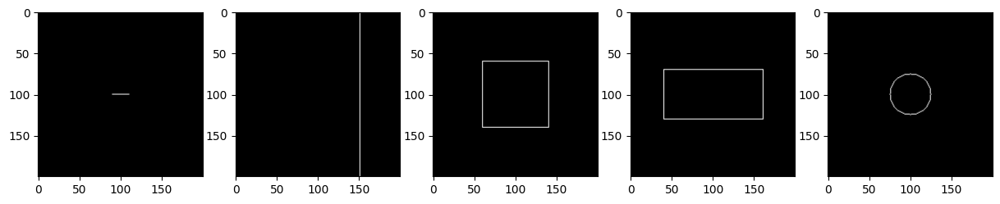

In [ ]:
#Ejercicio 1-1
# image dimensions
height, width = 200, 200

# Draw horizontal line
black_image = np.zeros((height, width), dtype=np.uint8)
fig,ax = plt.subplots(nrows=1,ncols=5,figsize=(15,15))
horizontal_line = cv2.line(black_image, (90, 100), (110, 100), 255, thickness=1)
ax[0].imshow(horizontal_line,cmap='gray')

# Draw vertical line
black_image = np.zeros((height, width), dtype=np.uint8)
vertical_line = cv2.line(black_image, (150, 0), (150, 200), 255, thickness=1)
ax[1].imshow(vertical_line,cmap='gray')

# Draw square
black_image = np.zeros((height, width), dtype=np.uint8)
square_side = 80
square = cv2.rectangle(black_image,(width//2-square_side//2,height//2-square_side//2),(width//2+square_side//2,height//2+square_side//2),255,thickness=1)
ax[2].imshow(square,cmap='gray')

# Draw rectangle
black_image = np.zeros((height, width), dtype=np.uint8)
rectangle_width = 120
rectangle_height = 60
rectangule = cv2.rectangle(black_image,(width//2-rectangle_width//2,height//2-rectangle_height//2),(width//2+rectangle_width//2,height//2+rectangle_height//2),255,thickness=1)
ax[3].imshow(rectangule,cmap='gray')

# Draw square
black_image = np.zeros((height, width), dtype=np.uint8)
radius = 25
circle = cv2.circle(black_image,(width//2,height//2),radius,255,thickness=1)
ax[4].imshow(circle,cmap='gray')

tf_horizontal_line = np.abs(fftshift(fft2(horizontal_line)))
tf_vertical_line = np.abs(fftshift(fft2(vertical_line)))
tf_square = np.abs(fftshift(fft2(square)))
tf_rectangule = np.abs(fftshift(fft2(rectangule)))
tf_circle = np.abs(fftshift(fft2(circle)))

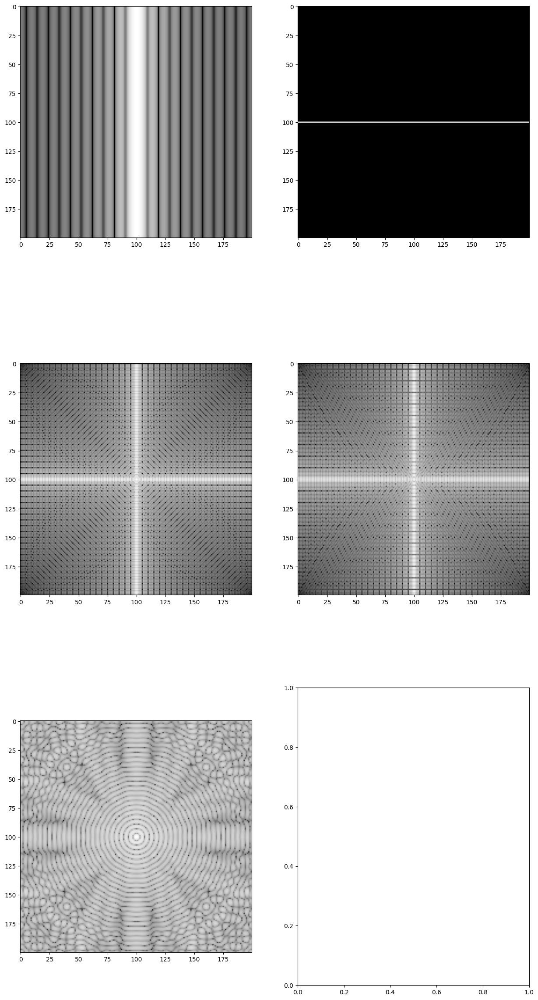

In [ ]:
#Ejercicio 1-2
#Plot inverse fourier transform in 2D
fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(15,30))
ax[0,0].imshow(np.log1p(tf_horizontal_line),cmap='gray')
ax[0,1].imshow(np.log1p(tf_vertical_line),cmap='gray')
ax[1,0].imshow(np.log1p(tf_square),cmap='gray')
ax[1,1].imshow(np.log1p(tf_rectangule),cmap='gray')
ax[2,0].imshow(np.log1p(tf_circle),cmap='gray')

Text(0.5, 0, 'Z')

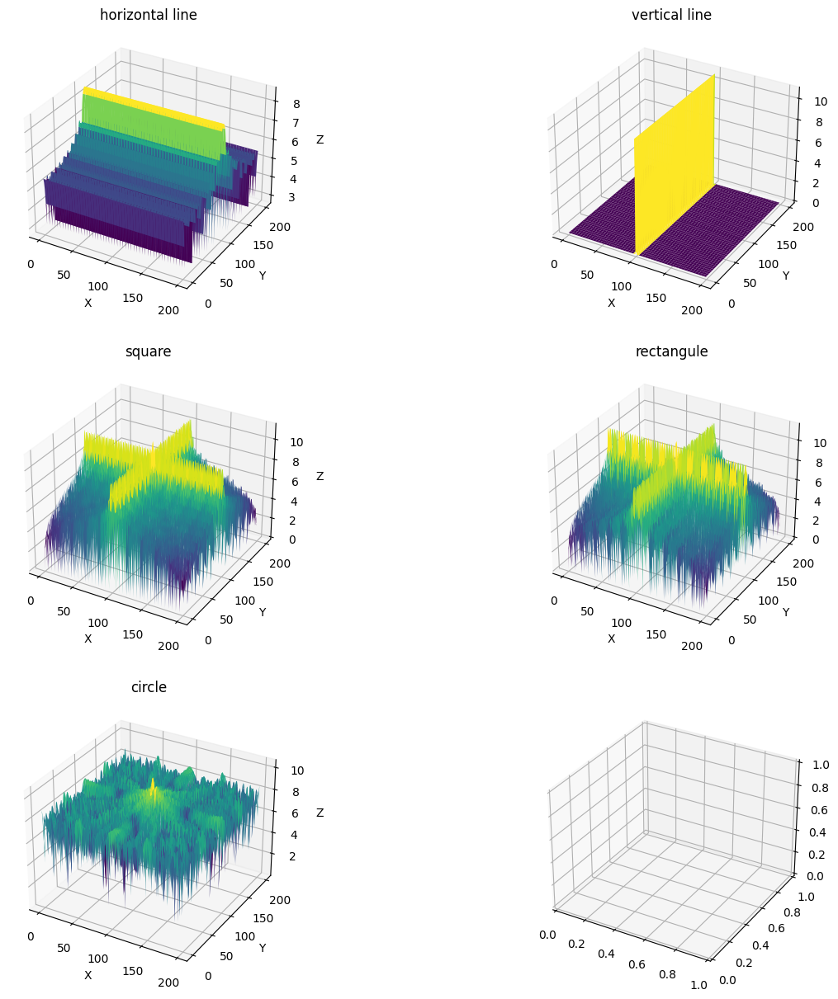

In [ ]:
#Plot inverse fourier trasnform in 3D
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 15), subplot_kw={'projection': '3d'})
x = np.linspace(0, 199, 200)
y = np.linspace(0, 199, 200)
x, y = np.meshgrid(x, y)
# print(tf_vertical_line[50,50:200])
axs[0,0].plot_surface(y, x, np.log1p(tf_horizontal_line), cmap='viridis')
axs[0,0].set_title('horizontal line');axs[0,0].set_xlabel('X');axs[0,0].set_ylabel('Y');axs[0,0].set_zlabel('Z')
axs[0,1].plot_surface(y, x, np.log1p(tf_vertical_line), cmap='viridis')
axs[0,1].set_title('vertical line');axs[0,1].set_xlabel('X');axs[0,1].set_ylabel('Y');axs[0,1].set_zlabel('Z')
axs[1,0].plot_surface(y, x, np.log1p(tf_square), cmap='viridis')
axs[1,0].set_title('square');axs[1,0].set_xlabel('X');axs[1,0].set_ylabel('Y');axs[1,0].set_zlabel('Z')
axs[1,1].plot_surface(y, x, np.log1p(tf_rectangule), cmap='viridis')
axs[1,1].set_title('rectangule');axs[1,1].set_xlabel('X');axs[1,1].set_ylabel('Y');axs[1,1].set_zlabel('Z')
axs[2,0].plot_surface(y, x, np.log1p(tf_circle), cmap='viridis')
axs[2,0].set_title('circle');axs[2,0].set_xlabel('X');axs[2,0].set_ylabel('Y');axs[2,0].set_zlabel('Z')

In [ ]:
#Explanation
#Horizontal line: the sinc function is observed with large lateral lobes because the line es thin
 #There are artifact in the graph of fourier transform as a consequence of using rectangular window fuction in fourier.
 #If the line is getting shorter, the energy in the sinc function will be distributed

#Vectical line: In this case the line crosses completly the image so there is a high energy in the horizontal sinc function because there are
 #more pixel contributing or, put another way, there is more egde vertically

#Squeare:In the same way as horizontal and vertical line, there is energy in sinc functions ,both vertically and horizontally

#Rectangle: Similar to squeare but the sinc function in the vertical component has more energy and wider lobes than the sinc funcion in the horizontal
 # component because the rectangle is longer in the horizontal direction and there are more pixels contributing

#Circle: there is energy in the sinc functions in almost direction because the edges of the circle is producing discontinuities in almost directions
 #When we reduce the radious of the circle there are fewer perpendicular edges and as a concequence we have less energy at high frequencies, so
 #the fourier transform is getting like as a bidimesional sinc function where the energy is concentrated at low frequencies,that is, in the center

#In all cases if we move the drawing we obtain the same fourier transform

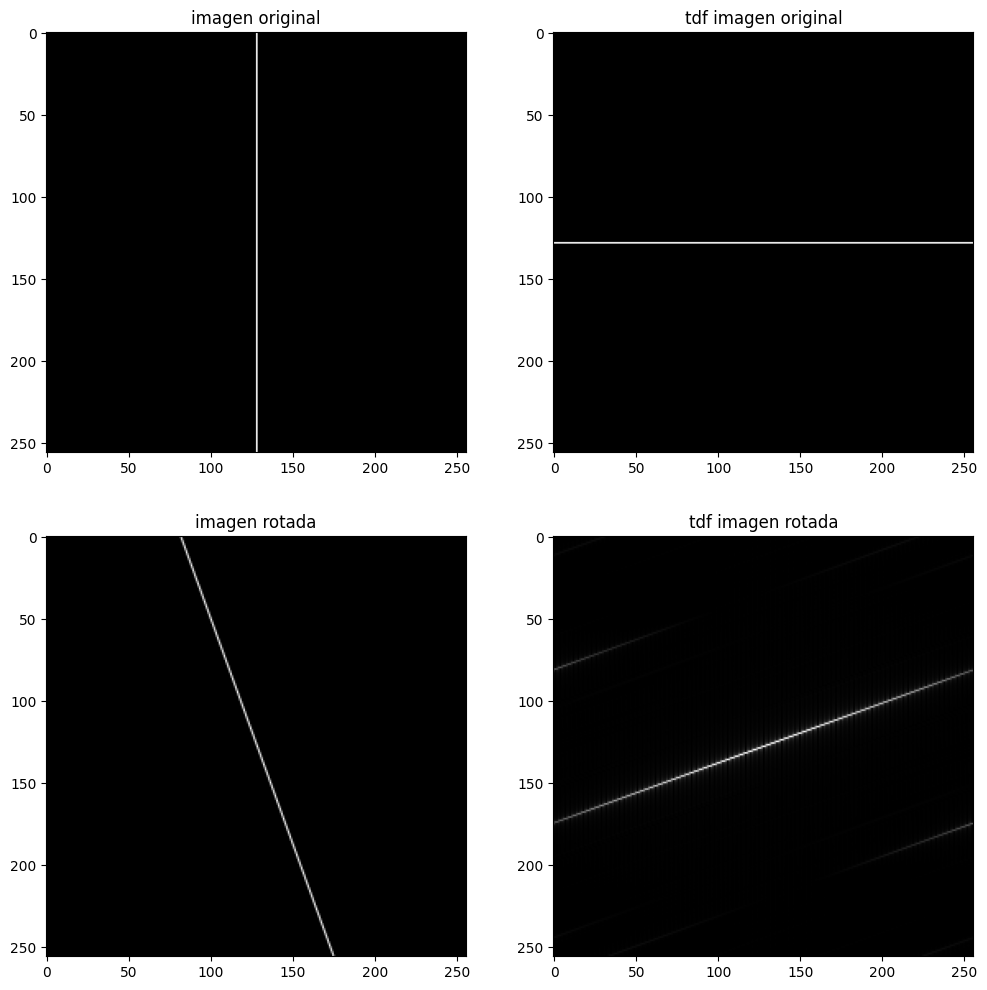

In [ ]:
#Ejercicio 1-3
width = 512; height = 512
line = np.zeros((width, height), dtype=np.uint8)
line = cv2.line(line, (width//2, 0), (width//2, height), 255, thickness=1)

angle = 20
rotate_line = imutils.rotate(line, angle)

line = line[width//4:width*3//4,height//4:height*3//4]
rotate_line = rotate_line[width//4:width*3//4,height//4:height*3//4]

# tf_horizontal_line = np.abs(fftshift(fft2(horizontal_line)))
tf_rotate_line = np.abs(fftshift(fft2(rotate_line)))
tf_line = np.abs(fftshift(fft2(line)))
fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
ax[0,0].imshow(line,cmap='gray')
ax[0,0].set_title('imagen original')
ax[0,1].imshow(tf_line,cmap='gray')
ax[0,1].set_title('tdf imagen original')
ax[1,0].imshow(rotate_line,cmap='gray')
ax[1,0].set_title('imagen rotada')
ax[1,1].imshow(tf_rotate_line,cmap='gray')
ax[1,1].set_title('tdf imagen rotada')
plt.show()

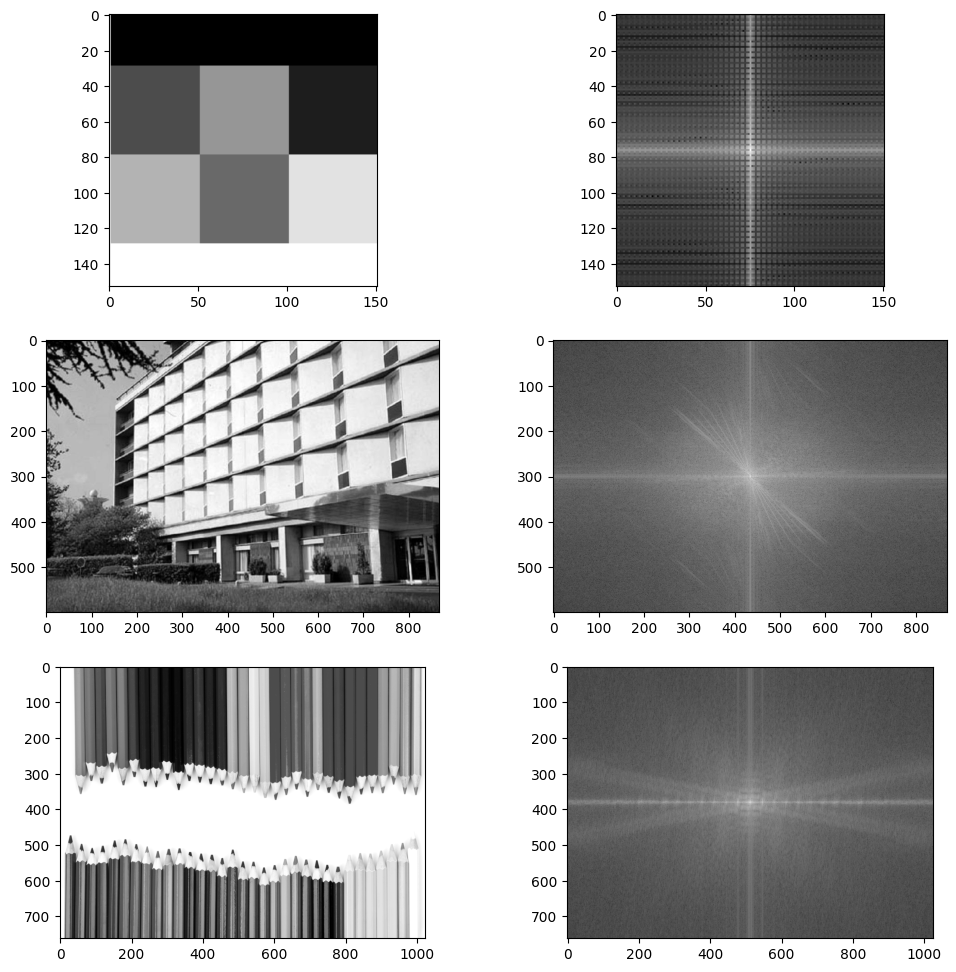

In [ ]:
#Ejercicio 1-4
patter = cv2.imread('pattern.tif', cv2.IMREAD_GRAYSCALE)
building = cv2.imread('building.jpg', cv2.IMREAD_GRAYSCALE)
lapices = cv2.imread('lapices02.jpg', cv2.IMREAD_GRAYSCALE)

tf_patter = np.abs(fftshift(fft2(patter)))
tf_building = np.abs(fftshift(fft2(building)))
tf_lapices = np.abs(fftshift(fft2(lapices)))

fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(12,12))
ax[0,0].imshow(patter,cmap='gray')
ax[0,1].imshow(np.log1p(tf_patter),cmap='gray')
ax[1,0].imshow(building,cmap='gray')
ax[1,1].imshow(np.log1p(tf_building),cmap='gray')
ax[2,0].imshow(lapices,cmap='gray')
ax[2,1].imshow(np.log1p(tf_lapices),cmap='gray')

In [ ]:
# ================== EXERCISE 2 ==================

In [ ]:
#Ejercicio 2-1
def openheim(imagen):
    #this fourier transform provides us with both separate real and imaginary.
    dft = cv2.dft(np.float32(imagen), flags=cv2.DFT_COMPLEX_OUTPUT)
    #convert to polar form
    magnitude, phase = cv2.cartToPolar(dft[:, :, 0], dft[:, :, 1])

    #we convert to the cartesian form as it is convenient for us and apply the inverse transformation.
    x,y = cv2.polarToCart(magnitude, np.zeros_like(phase))
    ft_only_magnitude = cv2.merge([x, y])
    x,y = cv2.polarToCart(np.ones_like(magnitude), phase)
    ft_only_phase = cv2.merge([x, y])
    #apply the inverse transform
    only_magnitude = cv2.idft(ft_only_magnitude)
    only_phase = cv2.idft(ft_only_phase)

    #obtain the maginitude
    only_magnitude = cv2.magnitude(only_magnitude[:, :, 0], only_magnitude[:, :, 1])
    only_phase = cv2.magnitude(only_phase[:, :, 0], only_phase[:, :, 1])

    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
    ax[0,0].imshow(imagen,cmap='gray')
    ax[0,0].set_title('imagen original')
    ax[0,1].imshow(np.log1p(fftshift(magnitude)),cmap='gray')
    ax[0,1].set_title('tdf imagen')
    ax[1,0].imshow(np.log1p(only_magnitude),cmap='gray')
    ax[1,0].set_title('magnitud de la tdf')
    ax[1,1].imshow(np.log1p(only_phase),cmap='gray')
    ax[1,1].set_title('fase de la tdf')
    plt.show()

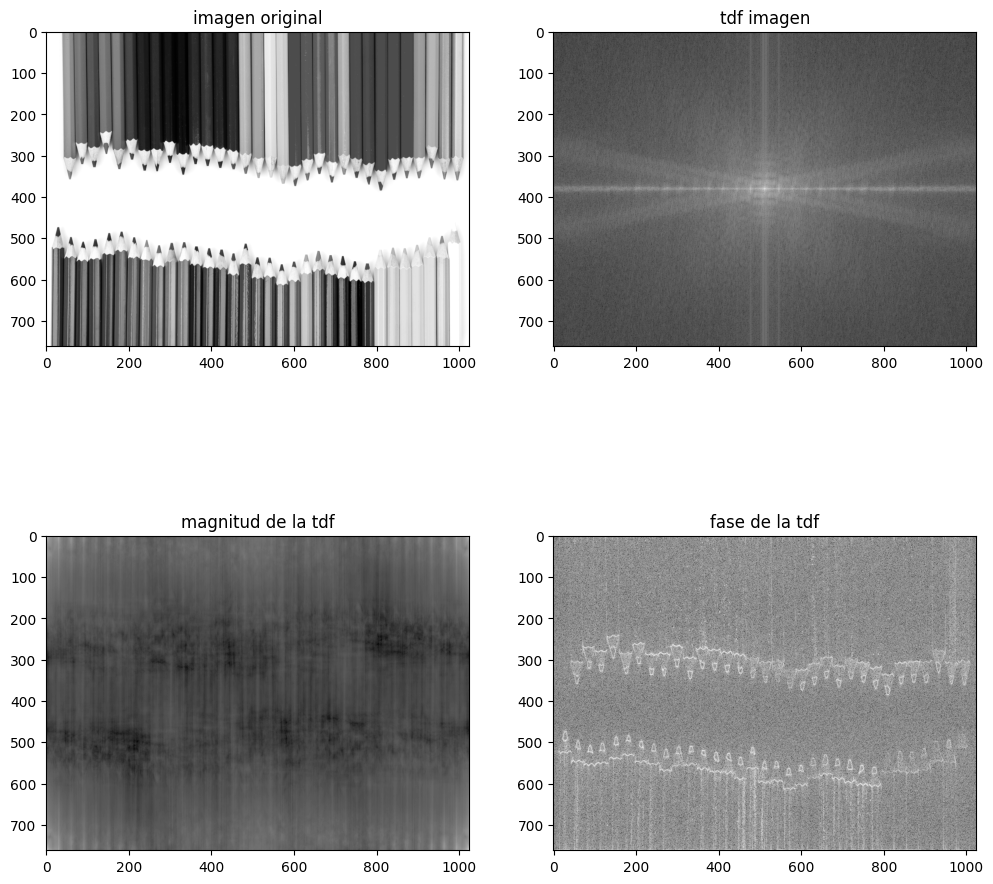

In [ ]:
lapices = cv2.imread('lapices02.jpg', cv2.IMREAD_GRAYSCALE)
openheim(lapices)

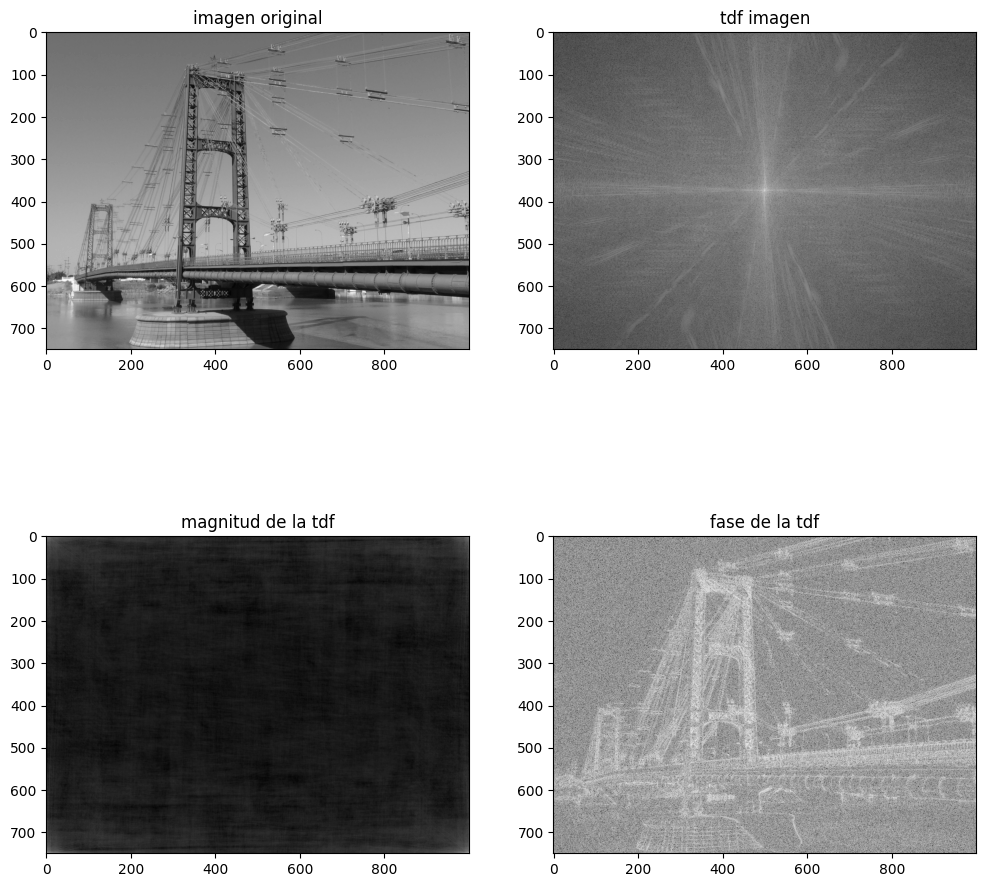

In [ ]:
#Ejercicio 2-2
puente = cv2.imread('puente.jpg', cv2.IMREAD_GRAYSCALE)
openheim(puente)

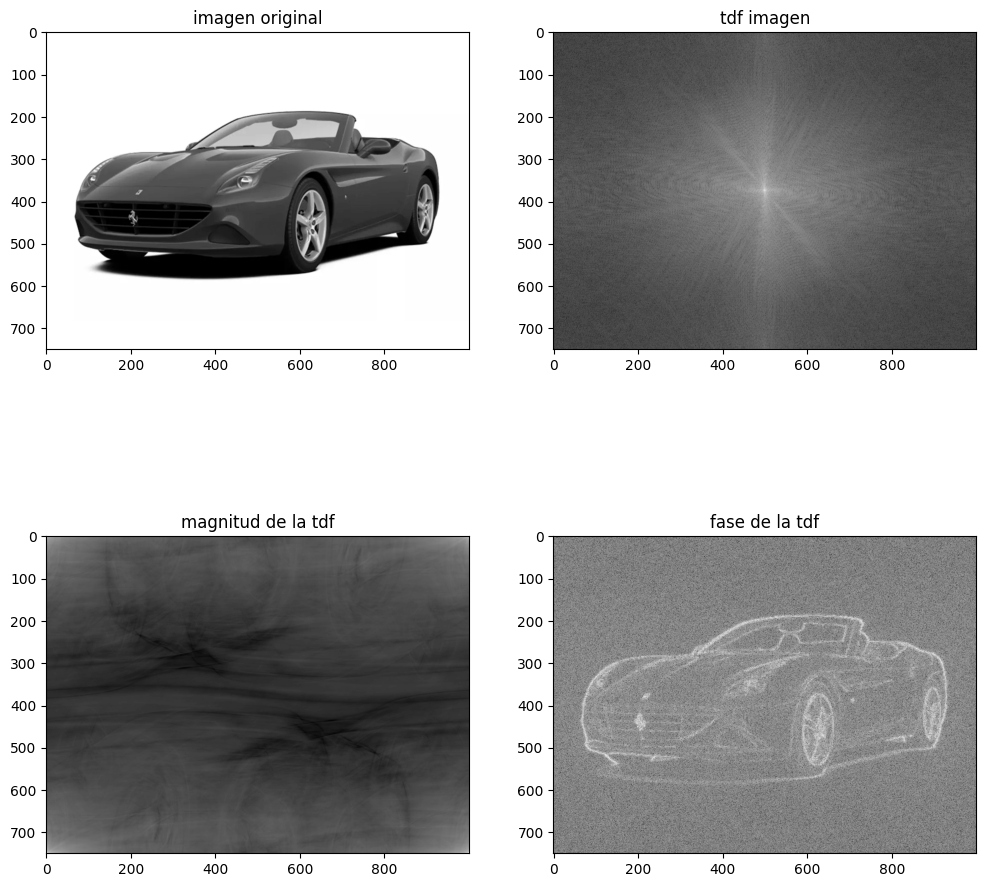

In [ ]:
ferrari = cv2.imread('ferrari-c.png', cv2.IMREAD_GRAYSCALE)
openheim(ferrari)

In [ ]:
# =============== EXERCISE 3 ================

In [ ]:
#Ejercicio 3-1
def ideal__lowpass_filter(image,radius):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    magnitude, phase = cv2.cartToPolar(dft[:, :, 0], dft[:, :, 1])
    print(radius)
    #Create ideal filter
    height,width  = image.shape
    # radius # Cutoff frequency
    mask = np.zeros((height,width), dtype=np.uint8)
    cv2.circle(mask,(width//2, height//2), int(radius),1, -1)

    #Apply filter in imaginary domain after aply fftshift
    magnitude_filtered = fftshift(magnitude) *mask
    phase_filtered = fftshift(phase) *mask

    x,y =cv2.polarToCart(np.fft.ifftshift(magnitude_filtered),np.fft.ifftshift(phase_filtered))
    dft_filtered = cv2.merge([x, y])
    #Recover filtered image
    smoothing_image = cv2.idft(dft_filtered)
    smoothing_image = cv2.magnitude(smoothing_image[:, :, 0], smoothing_image[:, :, 1])

    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
    ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
    ax[0,1].imshow(smoothing_image,cmap='gray'); ax[0,1].set_title('smoothing image')
    ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
    ax[1,1].imshow(np.log1p(fftshift(magnitude)),cmap='gray'); ax[1,1].set_title('fourier spectrum')

In [ ]:
# def bright(x):
#   print(x)
#   return x

# interact(bright,x=widgets.IntSlider(min=-100,max=100,step=1,value=10))

In [ ]:
def ideal_lowpass_filter(x):
  image = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
  dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
  magnitude, phase = cv2.cartToPolar(dft[:, :, 0], dft[:, :, 1])

  #Create ideal filter
  height,width  = image.shape
  # radius # Cutoff frequency
  mask = np.zeros((height,width), dtype=np.uint8)
  cv2.circle(mask,(width//2, height//2), int(x),1, -1)

  #Apply filter in imaginary domain after aply fftshift
  magnitude_filtered = fftshift(magnitude) *mask
  phase_filtered = fftshift(phase) *mask

  x,y =cv2.polarToCart(np.fft.ifftshift(magnitude_filtered),np.fft.ifftshift(phase_filtered))
  dft_filtered = cv2.merge([x, y])
  #Recover filtered image
  smoothing_image = cv2.idft(dft_filtered)
  smoothing_image = cv2.magnitude(smoothing_image[:, :, 0], smoothing_image[:, :, 1])

  fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
  ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('original image')
  ax[0,1].imshow(smoothing_image,cmap='gray'); ax[0,1].set_title('smoothing image')
  ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
  ax[1,1].imshow(np.log1p(fftshift(magnitude)),cmap='gray'); ax[1,1].set_title('fourier spectrum')
  plt.show()

interact(ideal_lowpass_filter,x=widgets.IntSlider(min=0,max=100,step=1,value=10))

interactive(children=(IntSlider(value=10, description='x'), Output()), _dom_classes=('widget-interact',))

<function __main__.ideal_lowpass_filter(x)>

In [ ]:
image = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
ideal__lowpass_filter(image,radius=50)

In [ ]:
#Ejercicio 3-2
def butterworth_lowpass_filter(image, cutoff, n):
  imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)

  height,width  = image.shape
  centre_y, centre_x = height // 2, width // 2
  #Create mask
  mask = np.zeros((height, width), dtype=np.float32)
  for i in range(height):
      for j in range(width):
          mask[i, j] = 1 / (1 + (np.sqrt((i - centre_y) ** 2 + (j - centre_x) ** 2)) / cutoff) ** (2 * n)
  #Apply mask
  fft = np.fft.fft2(image)
  fft_shift = fftshift(fft)
  fft_filtered = fft_shift * mask

  image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
  image_filtered = np.abs(image_filtered).astype(np.uint8)

  fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
  ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
  ax[0,1].imshow(image_filtered,cmap='gray'); ax[0,1].set_title('smoothing image')
  ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
  ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')
  plt.show()

In [ ]:
def butterworth_lowpass_filter(cutoff, n):
  imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)

  height,width  = image.shape
  centre_y, centre_x = height // 2, width // 2
  #Create mask
  mask = np.zeros((height, width), dtype=np.float32)
  for i in range(height):
      for j in range(width):
          mask[i, j] = 1 / (1 + (np.sqrt((i - centre_y) ** 2 + (j - centre_x) ** 2)) / cutoff) ** (2 * n)
  #Apply mask
  fft = np.fft.fft2(image)
  fft_shift = fftshift(fft)
  fft_filtered = fft_shift * mask

  image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
  image_filtered = np.abs(image_filtered).astype(np.uint8)

  fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
  ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
  ax[0,1].imshow(image_filtered,cmap='gray'); ax[0,1].set_title('smoothing image')
  ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
  ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')
  plt.show()

interact(butterworth_lowpass_filter,cutoff=widgets.IntSlider(min=0,max=100,step=1,value=10), n=widgets.IntSlider(min=0,max=20,step=1,value=1))

interactive(children=(IntSlider(value=10, description='cutoff'), IntSlider(value=1, description='n', max=20), …

<function __main__.butterworth_lowpass_filter(cutoff, n)>

In [ ]:
imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
cutoff_frequency = 50
order = 5
butterworth_lowpass_filter(imagen, cutoff_frequency,order)

In [ ]:
#Explanation exercide 4-3
#In the gaussian filter if we increse the sigma we have a larger cicle in the center and then if
 #we apply fft to this filter, we have a new filter with a smaller circle in the center in the
 #frequency domain, because the energy of the initial filter is concentred

Text(0.5, 1.0, 'mask * fft')

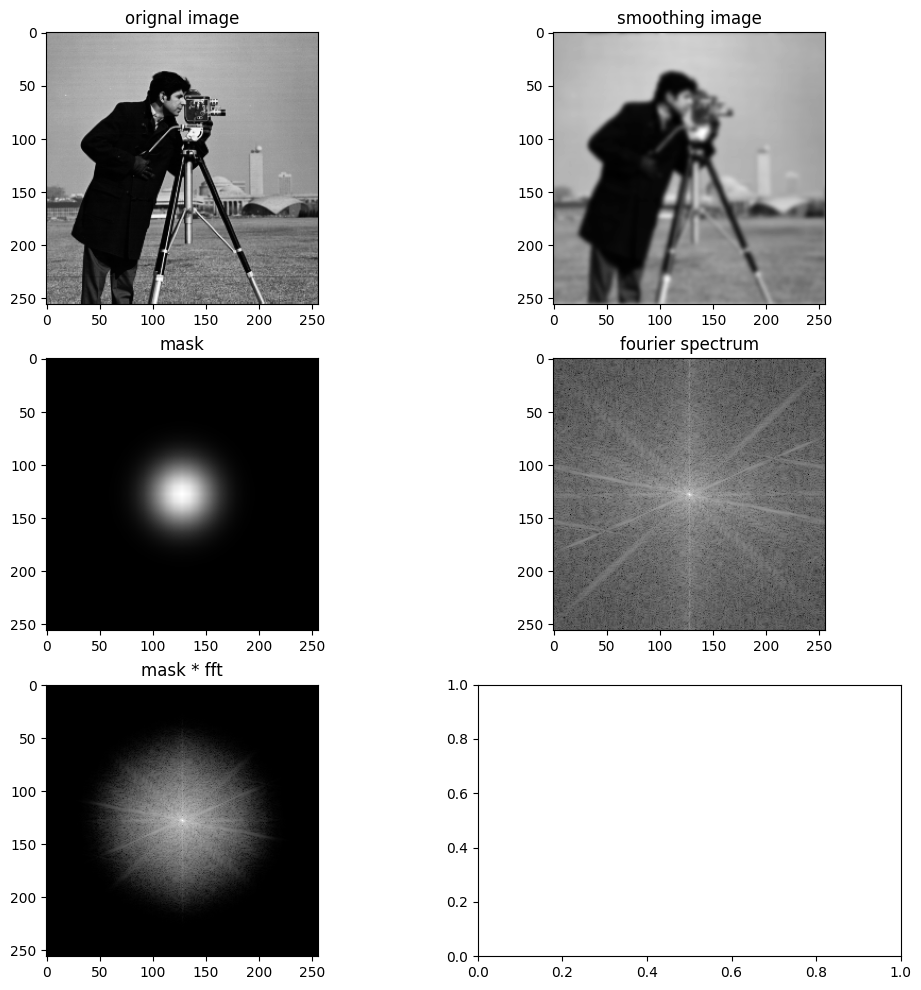

In [ ]:
#Ejercicio 4 -3
imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
height,width  = image.shape
#Create mask
sigma = 2
mask = np.zeros((35, 35), dtype=np.float32)
for u in range(35):
    for v in range(35):
        distance = (u - 35//2) ** 2 + (v - 35//2) ** 2
        mask[u, v] = np.exp(-distance / (2 * sigma ** 2))
mask = np.abs(fftshift(fft2(mask)))
mask = cv2.resize(mask, (width, height))
mask = cv2.normalize(mask, None, 0, 1, cv2.NORM_MINMAX)
#Apply mask
fft = np.fft.fft2(image)
fft_shift = fftshift(fft)
fft_filtered = fft_shift * mask

image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
image_filtered = np.abs(image_filtered).astype(np.uint8)

fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(12,12))
ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
ax[0,1].imshow(image_filtered,cmap='gray'); ax[0,1].set_title('smoothing image')
ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')
ax[2,0].imshow(np.log1p(np.abs(fft_filtered)),cmap='gray'); ax[2,0].set_title('mask * fft')

In [ ]:
#Ejercicio 4-4
def gaussian_lowpass_filter(sigma):
  imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
  height,width  = image.shape
  centre_y, centre_x = height // 2, width // 2

  #Create mask
  mask = np.zeros((height, width), dtype=np.float32)
  for u in range(height):
      for v in range(width):
          distance = (u - centre_y) ** 2 + (v - centre_x) ** 2
          mask[u, v] = np.exp(-distance / (2 * sigma ** 2))
  #Apply mask
  fft = np.fft.fft2(image)
  fft_shift = fftshift(fft)
  fft_filtered = fft_shift * mask

  image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
  image_filtered = np.abs(image_filtered).astype(np.uint8)

  fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
  ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
  ax[0,1].imshow(image_filtered,cmap='gray'); ax[0,1].set_title('smoothing image')
  ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
  ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')
  plt.show()
#sigma = 50

interact(gaussian_lowpass_filter,sigma=widgets.IntSlider(min=0,max=100,step=1,value=1))

interactive(children=(IntSlider(value=1, description='sigma'), Output()), _dom_classes=('widget-interact',))

<function __main__.gaussian_lowpass_filter(sigma)>

In [ ]:
#Ejercicio 3-5
def ideal_highpass_filter(image,radius):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    magnitude, phase = cv2.cartToPolar(dft[:, :, 0], dft[:, :, 1])

    #Create ideal filter
    height,width  = image.shape
    radius # Cutoff frequency
    mask = np.ones((height,width), dtype=np.uint8)
    cv2.circle(mask,(width//2, height//2), radius,0, -1)

    #Apply filter in imaginary domain after aply fftshift
    magnitude_filtered = fftshift(magnitude) *mask
    phase_filtered = fftshift(phase) *mask

    x,y =cv2.polarToCart(np.fft.ifftshift(magnitude_filtered),np.fft.ifftshift(phase_filtered))
    dft_filtered = cv2.merge([x, y])
    #Recover filtered image
    smoothing_image = cv2.idft(dft_filtered)
    smoothing_image = cv2.magnitude(smoothing_image[:, :, 0], smoothing_image[:, :, 1])
    #Normalize
    smoothing_image = ((smoothing_image - np.min(smoothing_image)) / (np.max(smoothing_image) - np.min(smoothing_image))) * 255
    #Add gray average
    smoothing_image= smoothing_image+np.mean(image)
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
    ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
    ax[0,1].imshow(smoothing_image,cmap='gray',vmin=0, vmax=255); ax[0,1].set_title('smoothing image')
    ax[1,0].imshow(mask,cmap='gray'); ax[1,0].set_title('mask')
    ax[1,1].imshow(np.log1p(fftshift(magnitude)),cmap='gray'); ax[1,1].set_title('fourier spectrum')

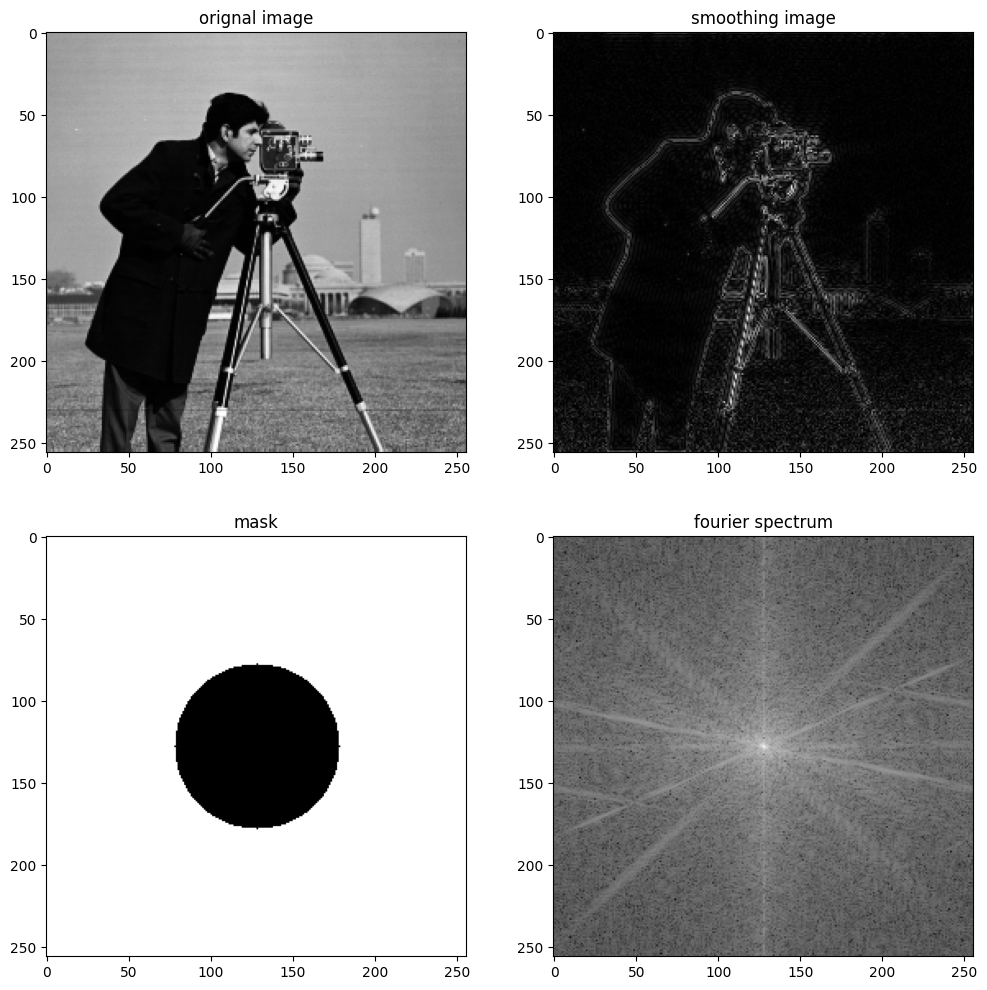

In [ ]:
image = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
ideal_highpass_filter(image,radius=50)

In [ ]:
def butterworth_highpass_filter(image, cutoff, n):
    height,width  = image.shape
    centre_y, centre_x = height // 2, width // 2
    #Create mask
    mask = np.ones((height, width), dtype=np.float32)
    for i in range(height):
        for j in range(width):
            mask[i, j] = 1 / (1 + (np.sqrt((i - centre_y) ** 2 + (j - centre_x) ** 2) / cutoff) ** (2 * n))
    #Apply mask
    fft = np.fft.fft2(image)
    fft_shift = fftshift(fft)
    fft_filtered = fft_shift * (1-mask)

    image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
    image_filtered = np.abs(image_filtered).astype(np.uint8)
    #Normalize
    image_filtered = ((image_filtered - np.min(image_filtered)) / (np.max(image_filtered) - np.min(image_filtered))) * 255
    #Add gray average
    image_filtered= image_filtered+np.mean(image)
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
    ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
    ax[0,1].imshow(image_filtered,cmap='gray',vmin=0, vmax=255); ax[0,1].set_title('smoothing image')
    ax[1,0].imshow(1-mask,cmap='gray'); ax[1,0].set_title('mask')
    ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')

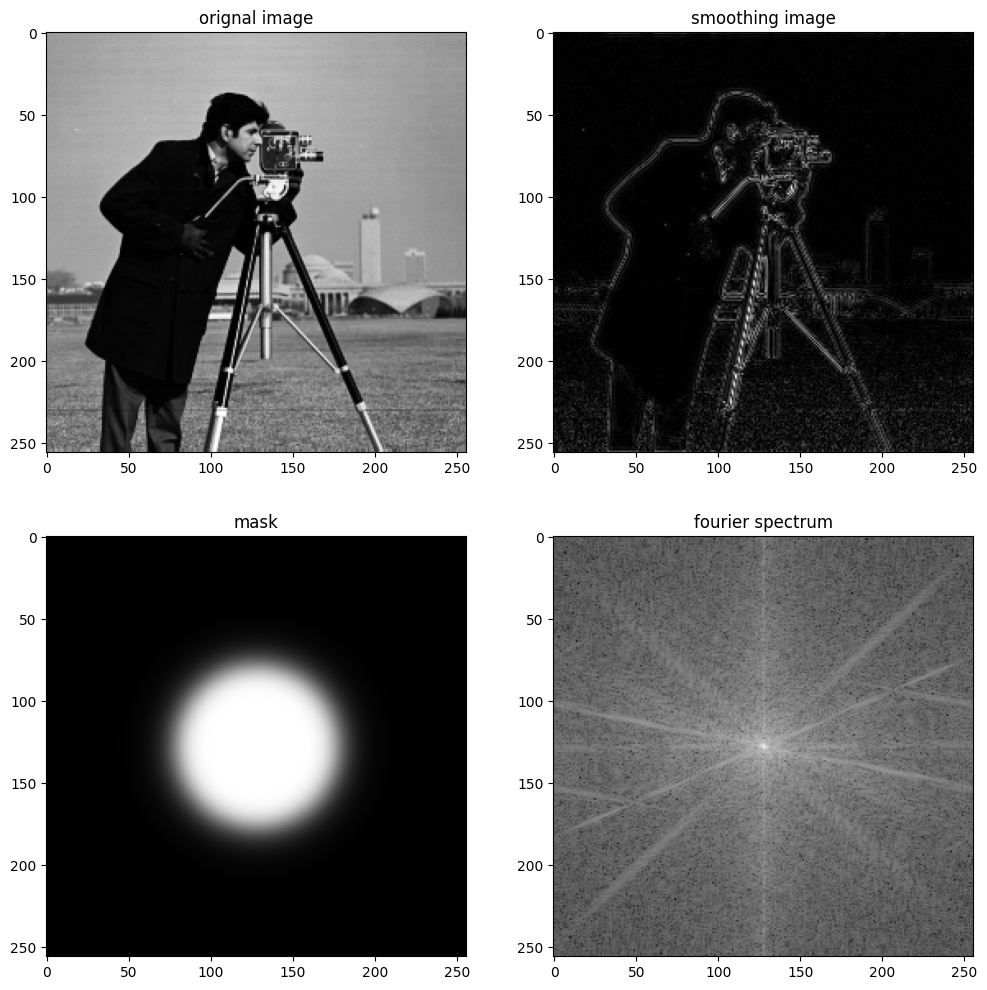

In [ ]:
imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
cutoff_frequency = 50
order = 5
butterworth_highpass_filter(imagen, cutoff_frequency,order)

Text(0.5, 1.0, 'mask * fft')

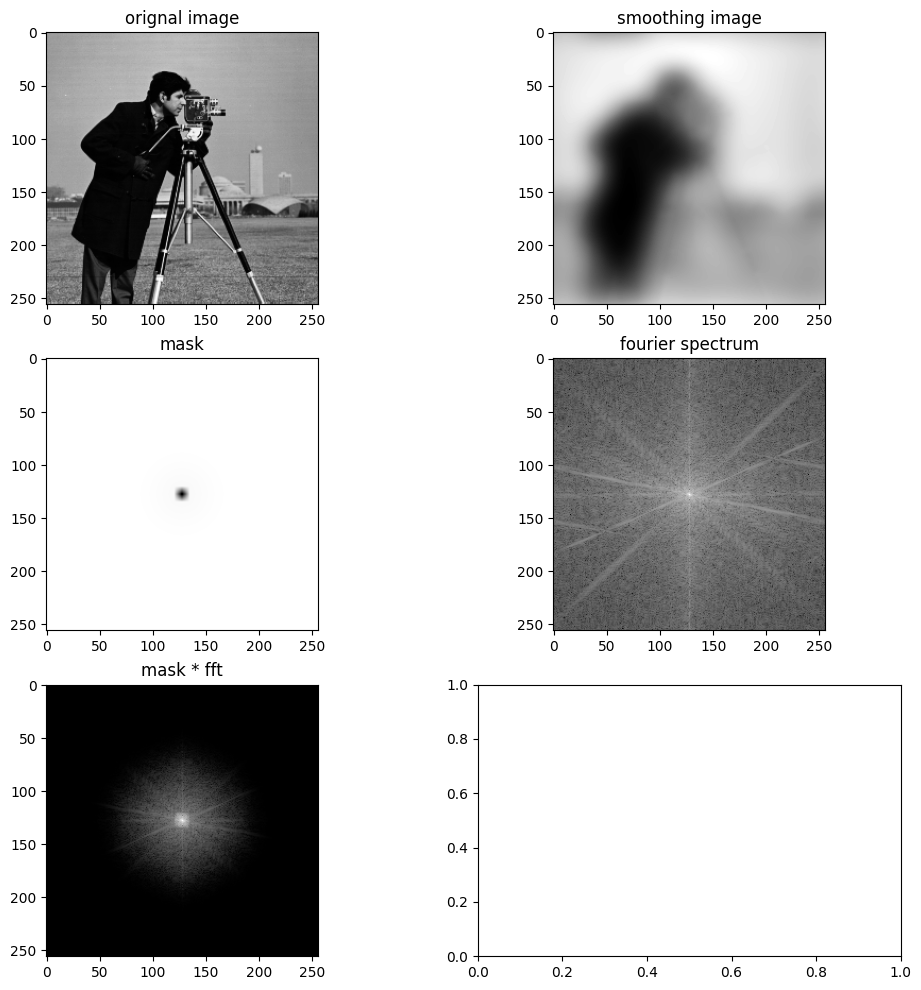

In [ ]:
imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
height,width  = image.shape
#Create mask
sigma = 2
mask = np.zeros((35, 35), dtype=np.float32)
for u in range(35):
    for v in range(35):
        distance = (u - 35//2) ** 2 + (v - 35//2) ** 2
        mask[u, v] = np.exp(-distance / (2 * sigma ** 2))
mask = np.abs(fftshift(fft2(1-mask)))
mask = cv2.resize(mask, (width, height))
mask = cv2.normalize(mask, None, 0, 1, cv2.NORM_MINMAX)
#Apply mask
fft = np.fft.fft2(image)
fft_shift = fftshift(fft)
fft_filtered = fft_shift * mask

image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
image_filtered = np.abs(image_filtered).astype(np.uint8)

fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(12,12))
ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
ax[0,1].imshow(image_filtered,cmap='gray'); ax[0,1].set_title('smoothing image')
ax[1,0].imshow(1-mask,cmap='gray'); ax[1,0].set_title('mask')
ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')
ax[2,0].imshow(np.log1p(np.abs(fft_filtered)),cmap='gray'); ax[2,0].set_title('mask * fft')

In [ ]:
def gaussian_highpass_filter(image, sigma):
    height,width  = image.shape
    centre_y, centre_x = height // 2, width // 2

    #Create mask
    mask = np.zeros((height, width), dtype=np.float32)
    for u in range(height):
        for v in range(width):
            distance = (u - centre_y) ** 2 + (v - centre_x) ** 2
            mask[u, v] = np.exp(-distance / (2 * sigma ** 2))
    #Apply mask
    fft = np.fft.fft2(image)
    fft_shift = fftshift(fft)
    fft_filtered = fft_shift * (1-mask)

    image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
    image_filtered = np.abs(image_filtered).astype(np.uint8)
    #Normalize
    image_filtered = ((image_filtered - np.min(image_filtered)) / (np.max(image_filtered) - np.min(image_filtered))) * 255
    #Add gray average
    image_filtered= image_filtered+np.mean(image)

    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12))
    ax[0,0].imshow(image,cmap='gray'); ax[0,0].set_title('orignal image')
    ax[0,1].imshow(image_filtered,cmap='gray',vmin=0, vmax=255); ax[0,1].set_title('smoothing image')
    ax[1,0].imshow(1-mask,cmap='gray'); ax[1,0].set_title('mask')
    ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray'); ax[1,1].set_title('fourier spectrum')

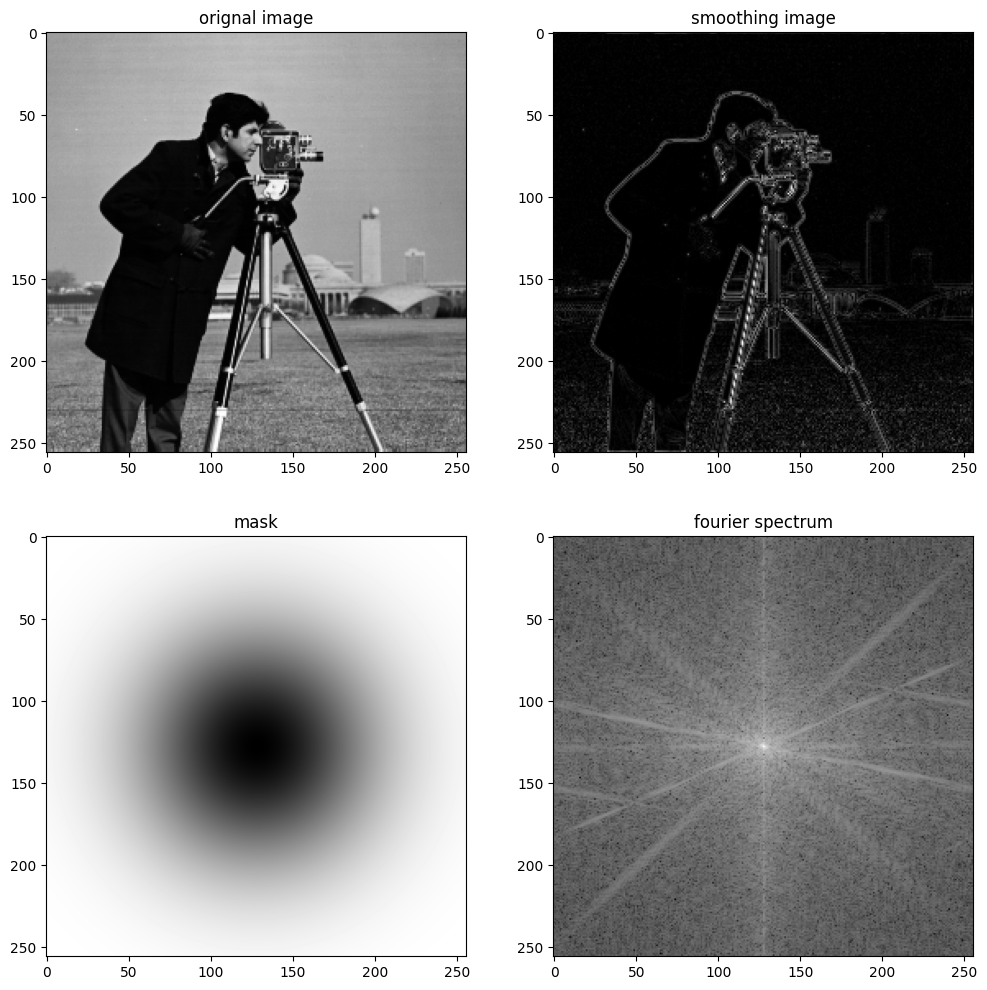

In [ ]:
imagen = cv2.imread('cameraman.tif', cv2.IMREAD_GRAYSCALE)
sigma = 50
gaussian_highpass_filter(imagen, sigma)

In [ ]:
# ============= EXCERCISE 4 ==============

In [ ]:
#Ejercicio 4-1
# Genere la funcion de transferencia H que caracteriza a un filtro homomorfico.
def homomorphic_filter_transfer_function(rows, cols, D0, glow, ghigh, orden):
  center_row, center_col = rows//2, cols//2
  H = np.zeros((rows, cols))
  for u in range(rows):
    for v in range(cols):
      D_uv = np.sqrt((u - center_row)**2 + (v - center_col)**2)
      H[u, v] = (ghigh - glow) * (1 - np.exp(-(D_uv**2) / (D0**2)))**orden + glow
  return H

In [ ]:
# Ejercicio 4-2
# Aplique el proceso en las imagenes ‘casilla.tif’ y ‘reunion.tif’, con valores apropiados de gL, gH, D0 y orden (prueba y error en cada imagen...).

def homomorphic_filter(d0,glow,ghigh,orden):
  img = cv2.imread('casilla.tif', cv2.IMREAD_GRAYSCALE)
  # img = cv2.imread('reunion.tif', cv2.IMREAD_GRAYSCALE)

  height,width = img.shape
  #Create mask
  H = homomorphic_filter_transfer_function(height, width, d0, glow, ghigh, orden)
  #Apply mask
  fft1 = np.fft.fft2(img)
  fft_shift = fftshift(fft1)
  fft_filtered = fft_shift * (1-H)
  image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
  image_filtered = np.abs(image_filtered).astype(np.uint8)

  fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,12))
  ax[0].imshow(img,cmap='gray')
  ax[0].set_title('original image casilla')
  ax[1].imshow(image_filtered,cmap='gray')
  ax[1].set_title('smoothing image casilla')
  plt.show()

interact(homomorphic_filter,
         d0=widgets.IntSlider(min=1,max=20,step=1,value=1),
         glow=widgets.FloatSlider(min=0.1,max=0.5,step=0.05,value=0.1),
         ghigh=widgets.FloatSlider(min=0.5,max=1,step=0.05,value=0.5),
         orden=widgets.IntSlider(min=1,max=20,step=1,value=1)
         )

interactive(children=(IntSlider(value=1, description='d0', max=20, min=1), FloatSlider(value=0.1, description=…

<function __main__.homomorphic_filter(d0, glow, ghigh, orden)>

In [ ]:
def homomorphic_filter(d0,glow,ghigh,orden):
  # img = cv2.imread('casilla.tif', cv2.IMREAD_GRAYSCALE)
  img = cv2.imread('reunion.tif', cv2.IMREAD_GRAYSCALE)

  height,width = img.shape
  #Create mask
  H = homomorphic_filter_transfer_function(height, width, d0, glow, ghigh, orden)
  #Apply mask
  fft1 = np.fft.fft2(img)
  fft_shift = fftshift(fft1)
  fft_filtered = fft_shift * (1-H)
  image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
  image_filtered = np.abs(image_filtered).astype(np.uint8)

  fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,12))
  ax[0].imshow(img,cmap='gray')
  ax[0].set_title('original image casilla')
  ax[1].imshow(image_filtered,cmap='gray')
  ax[1].set_title('smoothing image casilla')
  plt.show()

interact(homomorphic_filter,
         d0=widgets.IntSlider(min=1,max=5,step=1,value=1),
         glow=widgets.FloatSlider(min=0.1,max=0.5,step=0.05,value=0.1),
         ghigh=widgets.FloatSlider(min=0.5,max=1,step=0.05,value=0.5),
         orden=widgets.IntSlider(min=1,max=20,step=1,value=1)
         )

interactive(children=(IntSlider(value=1, description='d0', max=5, min=1), FloatSlider(value=0.1, description='…

<function __main__.homomorphic_filter(d0, glow, ghigh, orden)>

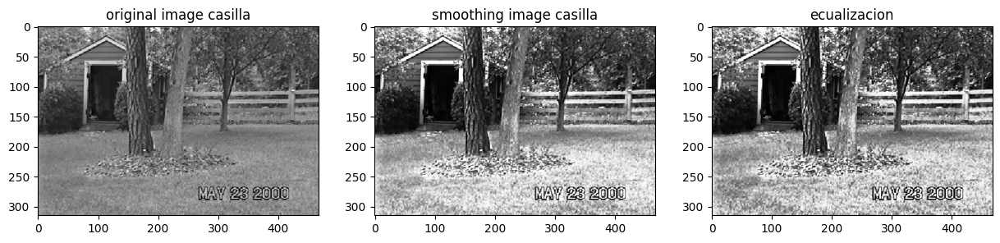

In [ ]:
# Ejercicio 4-3
# Ecualice el resultado del filtrado y visualıcelo junto a los demas.

img = cv2.imread('casilla.tif', cv2.IMREAD_GRAYSCALE)

img_ecualizada = cv2.equalizeHist(img)

height,width = img.shape
#Create mask
H = homomorphic_filter_transfer_function(height, width, D0=10, glow=0.4, ghigh=0.6, orden=4)
#Apply mask
fft1 = np.fft.fft2(img)
fft_shift = fftshift(fft1)
fft_filtered = fft_shift * (1-H)
image_filtered = np.fft.ifft2(np.fft.ifftshift(fft_filtered))
image_filtered = np.abs(image_filtered).astype(np.uint8)
image_filtered = cv2.equalizeHist(image_filtered)

fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
ax[0].imshow(img,cmap='gray')
ax[0].set_title('original image casilla')
ax[1].imshow(image_filtered,cmap='gray')
ax[1].set_title('smoothing image casilla')
ax[2].imshow(img_ecualizada,cmap='gray')
ax[2].set_title('ecualizacion')
plt.show()



In [ ]:
# ============== EXERCISE 5 ================

In [ ]:
# Ejercicio 5-1
# funcion de transferencia correspondiente a un filtro de alta potencia segun HAP = (A − 1) + Hpa,
# y a un filtro de enfasis de alta frecuencia segun: Heaf = a + b*Hpa.
def high_boost_filter_gauss(image,A,sigma):
  # Aplicar un filtro de suavizado (filtro pasa bajo)
  height,width = image.shape
  centre_y, centre_x = height // 2, width // 2
  H = np.zeros((height, width), dtype=np.float32)
  for u in range(height):
    for v in range(width):
      distance = (u - centre_y) ** 2 + (v - centre_x) ** 2
      H[u, v] =  np.exp(-distance / (2 * sigma ** 2))
  return  1-H

In [ ]:
def crear_filtro_promediador(kernel_size,tipo):
  if tipo == 0:
    # filtro de caja para suavizar una imagen reduciendo el ruido y eliminando detalles pequeños
    return np.ones((kernel_size,kernel_size),np.float32) / (kernel_size*kernel_size)
  else:
    # filtro de cruz
    filtro = np.zeros((kernel_size, kernel_size), dtype=np.float32)
    filtro[:, int(kernel_size/2)] = 1.0
    filtro[int(kernel_size/2), :] = 1.0
    return filtro / kernel_size

In [ ]:
# Ejercicio 5-2
# aplique los filtros a la imagen ’camaleon.tif’, visualizando la imagen original junto a su TDF, y la imagen resultante con su TDF.
def filtros_h(a,b,A,sigma):
  img_camaleon = cv2.imread('camaleon.tif',cv2.IMREAD_GRAYSCALE)
  Hpa = high_boost_filter_gauss(img_camaleon,A,sigma)
  Heaf = a+b*Hpa
  Hap = (A-1)+Hpa
  #Apply mask
  fft1 = np.fft.fft2(img_camaleon)
  fft_shift = fftshift(fft1)

  fft_filtered_hpa = fft_shift * Hap
  fft_filtered_heaf = fft_shift *Heaf

  image_filtered_hpa = np.fft.ifft2(np.fft.ifftshift(fft_filtered_hpa))
  image_filtered_hpa = np.abs(image_filtered_hpa).astype(np.uint8)
  image_filtered_heaf = np.fft.ifft2(np.fft.ifftshift(fft_filtered_heaf))
  image_filtered_heaf = np.abs(image_filtered_heaf).astype(np.uint8)
  # image_filtered = cv2.equalizeHist(image_filtered)
  #Alta potencia dominio espacial
  filtro_caja = crear_filtro_promediador(kernel_size =9,tipo=0) #  tipo 0 caja
  img_camaleon_suaviazada_caja = cv2.filter2D(img_camaleon, -1, filtro_caja)
  alta_potencia_caja = cv2.subtract(np.clip(A*img_camaleon, 0, 255).astype(np.uint8),img_camaleon_suaviazada_caja)
  #Normalize
  #image_filtered_hpa = ((image_filtered_hpa - np.min(image_filtered_hpa)) / (np.max(image_filtered_hpa) - np.min(image_filtered_hpa))) * 255

  fig,ax = plt.subplots(nrows=2,ncols=4,figsize=(12,12))
  ax[0,0].imshow(img_camaleon,cmap='gray')
  ax[0,0].set_title('original image casilla')
  # ax[1,1].imshow(np.log1p(np.abs(fft_shift)),cmap='gray');
  ax[1,0].imshow(np.log1p(np.abs(fft_shift)),cmap='gray')
  ax[1,0].set_title('original fft')

  ax[0,1].imshow(image_filtered_hpa,cmap='gray')
  ax[0,1].set_title('imagen alta potencia')
  ax[1,1].imshow(np.log1p(np.abs(fft_filtered_hpa)),cmap='gray')
  ax[1,1].set_title('fft alta potencia')

  ax[0,2].imshow(image_filtered_heaf,cmap='gray')
  ax[0,2].set_title('imagen alto enfasis')
  ax[1,2].imshow(np.log1p(np.abs(fft_filtered_heaf)),cmap='gray')
  ax[1,2].set_title('fft alto enfasis')

  ax[0,3].imshow(alta_potencia_caja,cmap='gray')
  ax[0,3].set_title('alta potencia espacial')
  ax[1,3].imshow(np.log1p(np.abs(fftshift(fft2(alta_potencia_caja)))),cmap='gray')
  ax[1,3].set_title('fft alta potencia espacial')
  plt.show()

interact(filtros_h,
         a=widgets.FloatSlider(min=0,max=20,step=0.5,value=1),
         b=widgets.FloatSlider(min=0,max=20,step=0.5,value=1),
         A=widgets.FloatSlider(min=0,max=10,step=0.25,value=1),
         sigma=widgets.FloatSlider(min=10,max=50,step=1,value=50),
         )

interactive(children=(FloatSlider(value=1.0, description='a', max=20.0, step=0.5), FloatSlider(value=1.0, desc…

<function __main__.filtros_h(a, b, A, sigma)>

In [ ]:
# Ejercicio 5-3
# Compare la imagen de alta potencia con la que se obtiene al aplicar el filtro en el dominio espacial.


In [ ]:
# ============== EXERCISE 6 ===============

In [ ]:
# Ejercicio 6-1
# imagen normal
img_6 = cv2.imread('roman.webp',cv2.IMREAD_GRAYSCALE)
inicio_tiempo = time.time()                         # inicio el tiempo
fft1 = np.fft.fft2(img_6)
tiempo_transcurrido1 = time.time() - inicio_tiempo  # corto el tiempo
fft_shift = fftshift(fft1)
print('tamaño de imagen original: ',img_6.shape)
print('tiempo tdf original: ',tiempo_transcurrido1)


# imagen con tamaño optimo son potencias de 2
ancho, alto = img_6.shape
nuevo_alto = 2**int(np.ceil(np.log2(alto)))
nuevo_ancho = 2**int(np.ceil(np.log2(ancho)))
img_6_optima = img_6.copy()
img_6_optima = cv2.resize(img_6_optima,(nuevo_alto,nuevo_ancho))
inicio_tiempo = time.time()
fft2 = np.fft.fft2(img_6_optima)
tiempo_transcurrido2 = time.time() - inicio_tiempo
print('tamaño optimo: ',str(nuevo_ancho)+','+str(nuevo_alto))
print('timepo tdf optimo: ',tiempo_transcurrido2)
fft_shift2 = fftshift(fft2)

# imagen con tamaño optimo -1 pixel con ceros
img_6_optima_2 = img_6.copy()
img_6_optima_2 = cv2.resize(img_6_optima_2,(nuevo_alto,nuevo_ancho))
img_6_optima_2[0,:] = 0
img_6_optima_2[nuevo_ancho-1,:] = 0
img_6_optima_2[:,0] = 0
img_6_optima_2[:,nuevo_alto-1] = 0
# relleno de ceros
# relleno_alto = nuevo_alto - alto
# relleno_ancho = nuevo_ancho - ancho
# imagen = np.pad(imagen, ((0, relleno_alto), (0, relleno_ancho)), mode='constant')
inicio_tiempo = time.time()
fft3 = np.fft.fft2(img_6_optima_2)
tiempo_transcurrido3 = time.time() - inicio_tiempo
print('tamaño tdf optimo-1: ',tiempo_transcurrido3)
fft_shift3 = fftshift(fft3)

tamaño de imagen original:  (900, 1200)
tiempo tdf original:  0.06990909576416016
tamaño optimo:  1024,2048
timepo tdf optimo:  0.2104644775390625
tamaño tdf optimo-1:  0.1686258316040039


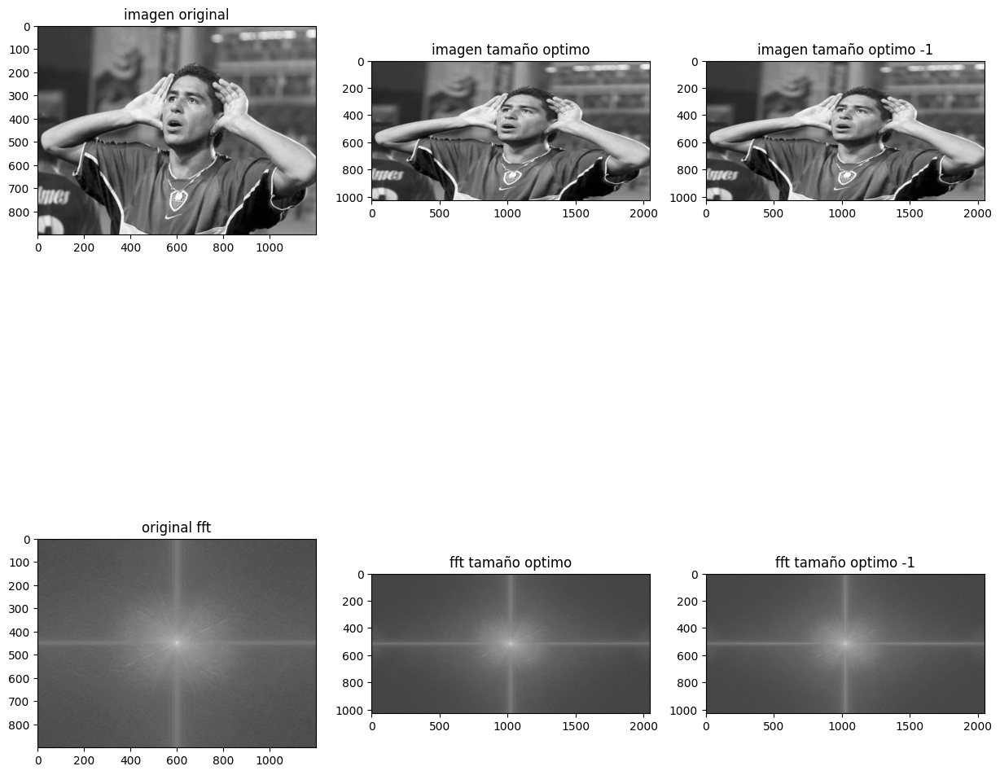

In [ ]:
fig, ax = plt.subplots(nrows=2,ncols=3,figsize=(15,15))
ax[0,0].imshow(img_6,cmap='gray')
ax[0,0].set_title('imagen original')
ax[1,0].imshow(np.log1p(np.abs(fft_shift)),cmap='gray')
ax[1,0].set_title('original fft')

ax[0,1].imshow(img_6_optima,cmap='gray')
ax[0,1].set_title('imagen tamaño optimo')
ax[1,1].imshow(np.log1p(np.abs(fft_shift2)),cmap='gray')
ax[1,1].set_title('fft tamaño optimo')


ax[0,2].imshow(img_6_optima,cmap='gray')
ax[0,2].set_title('imagen tamaño optimo -1')
ax[1,2].imshow(np.log1p(np.abs(fft_shift3)),cmap='gray')
ax[1,2].set_title('fft tamaño optimo -1')
plt.show()

In [ ]:
# ¿Que efecto numerico (objetivo) y a la vista (subjetivo) produce el agregado de ceros?
# Objetivamente
# el tiempo de calculo de la tdf de 0.02873826026916504
# para un tamaño optimo:  1024,2048
# el timepo de tdf optimo:  0.0609896183013916
# el tiempo de tdf optimo -1 pixel:  0.054567813873291016

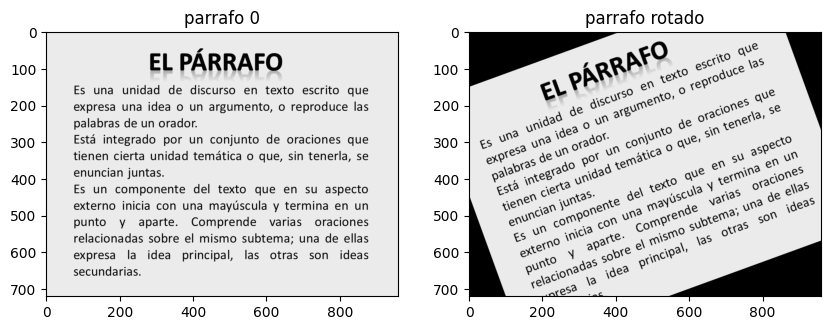

In [ ]:
# Ejercicio 6-2
# Realice una aplicacion de preprocesamiento para OCR.
# usted debe identificar si el texto esta rotado y de ser ası,debe corregir la orientacion del texto.
img_parrafo = cv2.imread('parrafo0.jpg',cv2.IMREAD_GRAYSCALE)
angle = 20
img_parrafo_rotado = imutils.rotate(img_parrafo, angle)

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(10,10))
ax[0].imshow(img_parrafo,cmap='gray')
ax[0].set_title('parrafo 0')
ax[1].imshow(img_parrafo_rotado,cmap='gray')
ax[1].set_title('parrafo rotado')
plt.show()

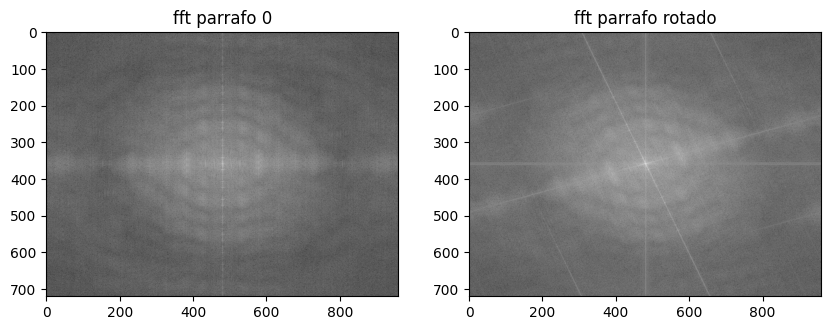

In [ ]:
# fft
fft1 = np.fft.fft2(img_parrafo)
fft_shift1 = fftshift(fft1)

fft2 = np.fft.fft2(img_parrafo_rotado)
fft_shift2 = fftshift(fft2)

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(10,10))
ax[0].imshow(np.log1p(np.abs(fft_shift1)),cmap='gray')
ax[0].set_title('fft parrafo 0')
ax[1].imshow(np.log1p(np.abs(fft_shift2)),cmap='gray')
ax[1].set_title('fft parrafo rotado')
plt.show()

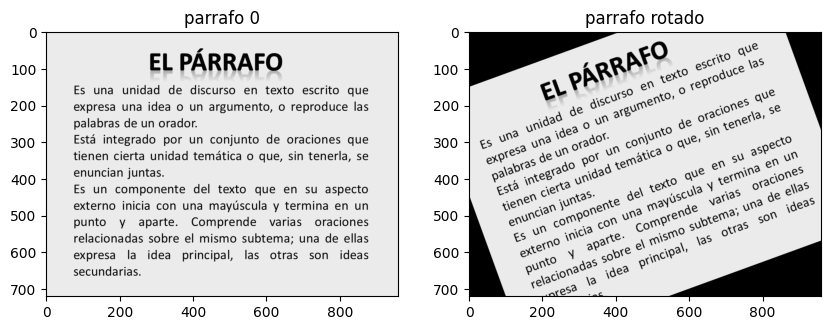

In [2]:
# Ejercicio 6-2
# Realice una aplicacion de preprocesamiento para OCR.
# usted debe identificar si el texto esta rotado y de ser ası,debe corregir la orientacion del texto.
img_parrafo = cv2.imread('parrafo0.jpg',cv2.IMREAD_GRAYSCALE)
angle = 20
img_parrafo_rotado = imutils.rotate(img_parrafo, angle)

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(10,10))
ax[0].imshow(img_parrafo,cmap='gray')
ax[0].set_title('parrafo 0')
ax[1].imshow(img_parrafo_rotado,cmap='gray')
ax[1].set_title('parrafo rotado')
plt.show()

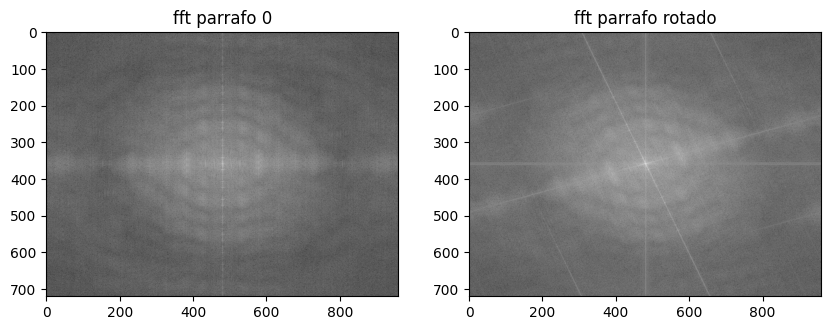

In [3]:
# fft
fft_parrafo = np.fft.fft2(img_parrafo)
fft_shift_parrafo = fftshift(fft_parrafo)

fft_parrafo_rotado = np.fft.fft2(img_parrafo_rotado)
fft_shift_rotado = fftshift(fft_parrafo_rotado)

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(10,10))
ax[0].imshow(np.log1p(np.abs(fft_shift_parrafo)),cmap='gray')
ax[0].set_title('fft parrafo 0')
ax[1].imshow(np.log1p(np.abs(fft_shift_rotado)),cmap='gray')
ax[1].set_title('fft parrafo rotado')
plt.show()

centro x,y:  360 480
posicion en x del maximo:  305


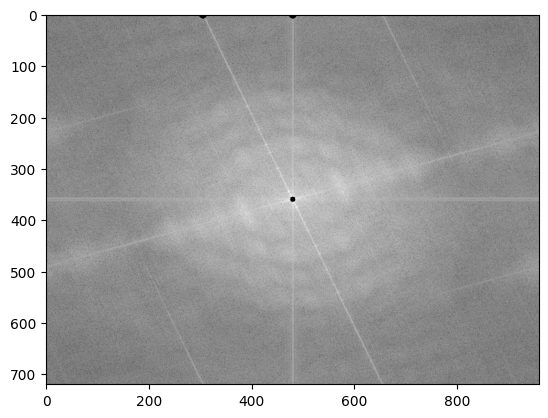

In [4]:
# la idea es tomar la columna del medio de la imagen y una fila si la imagen está derecha entonces la forma de la fftshift será
# de una cruz derecha, si no una cruz torcida para saber el angulo de rotación partimos de la columna central  hasta
width,height = fft_shift_rotado.shape
centre_y, centre_x = height // 2, width // 2
print('centro x,y: ',str(centre_x)+' '+str(centre_y))
row_selected = 0
fft_aux = np.log1p(np.abs(fft_shift_rotado))
max_x = np.argmax(fft_aux[row_selected,0:centre_y-20])
print('posicion en x del maximo: ',max_x)
img_copy = fft_aux.copy()
# armo el triangulo
cv2.circle(img_copy, (max_x, row_selected), 5, (0, 255, 0), thickness=5)
cv2.circle(img_copy, (centre_y, row_selected), 5, (0, 255, 0), thickness=5)
cv2.circle(img_copy, (centre_y, centre_x), 5, (0, 255, 0), thickness=-1)
plt.imshow(img_copy,cmap='gray')
plt.show()

tamaño del lado opuesto:  55
tamaño del lado adyacente:  480
angulo en radianes 0.11408577916815948
angulo de rotacion 6.536633648797066


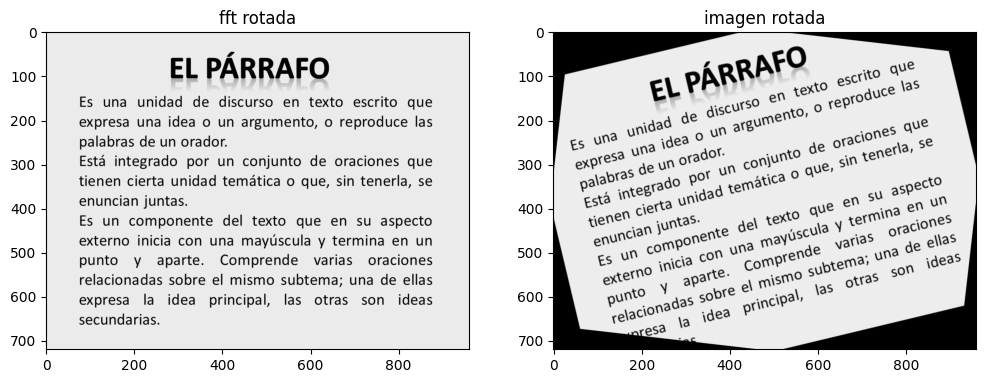

In [7]:
# lado_opuesto = xf - xi
# lado_adyacente = yf - yi
# angulo = tg^-1(lado_opuesto / lado_adyacente)
lado_opuesto = centre_x - max_x
print('tamaño del lado opuesto: ',lado_opuesto)
lado_adyacente = centre_y - row_selected
print('tamaño del lado adyacente: ',lado_adyacente)
# angulo_radianes = math.atan2(lado_opuesto,lado_adyacente)
angulo_radianes =  np.arctan(lado_opuesto/lado_adyacente)
print('angulo en radianes',np.arctan(lado_opuesto/lado_adyacente))
angulo_grados = math.degrees(angulo_radianes)
print('angulo de rotacion',angulo_grados)
img_nueva = imutils.rotate(img_parrafo_rotado, -angulo_grados)
fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,12))
ax[0].imshow(img_parrafo,cmap='gray')
ax[0].set_title('fft rotada')
ax[1].imshow(img_nueva,cmap='gray')
ax[1].set_title('imagen rotada')
plt.show()